### Description of the Dataset

The dataset contains information about engineering graduates and their job outcomes. Here’s a breakdown of the key features:

- **ID**: A unique identifier for each graduate.
- **Salary**: The annual salary that each graduate earns in their job.
- **DOJ**: Date of Joining the company.
- **DOL**: Date of Leaving the company (if applicable).
- **Designation**: The job title or role of the graduate.
- **JobCity**: The city where the job is located.
- **Gender**: The gender of the graduate.
- **DOB**: Date of Birth of the graduate.
- **10percentage**: Percentage score in the 10th grade.
- **10board**: Board of education for 10th grade.
- **12graduation**: Name of the school or institution for 12th grade.
- **12percentage**: Percentage score in the 12th grade.
- **12board**: Board of education for 12th grade.
- **CollegeID**: Identifier for the college attended.
- **CollegeTier**: The tier or rank of the college (e.g., Tier 1, Tier 2).
- **Degree**: The degree obtained (e.g., B.Tech, M.Tech).
- **Specialization**: The specific field of study within engineering.
- **collegeGPA**: Grade Point Average from college.
- **CollegeCityID**: Identifier for the city where the college is located.
- **CollegeCityTier**: The tier of the college's city.
- **CollegeState**: The state where the college is located.
- **GraduationYear**: The year of graduation.
- **English, Logical, Quant**: Scores in different skill areas.
- **Domain**: Knowledge in specific engineering domains.
- **ComputerProgramming, ElectronicsAndSemicon, etc.**: Scores in specialized engineering subjects.
- **Personality Traits**: Measures of conscientiousness, agreeableness, extraversion, neuroticism, and openness to experience.

### Objective of the Analysis

The main goal of analyzing this dataset is to find out what factors influence the salaries of engineering graduates. Here are the specific objectives:

1. **Identify Key Factors**: Understand which skills and characteristics (like grades, college tier, and personality traits) are most related to salary levels.

2. **Predict Salaries**: Create a model that can predict a graduate's salary based on their background and skills.

3. **Inform Educational Choices**: Help current and future students know what skills or experiences might lead to higher salaries, guiding them in their education and career paths.

4. **Explore Trends**: Look into how salaries vary by factors such as location, gender, and job roles, to identify potential inequalities or trends in the job market.

Overall, this analysis aims to provide valuable insights into the job market for engineering graduates, helping them make informed decisions about their education and careers.

## step 2

In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv(r"C:\Users\navee\Downloads\data.xlsx - Sheet1.csv")
data.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [3]:
data.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [16]:
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
print(numerical_columns)

Index(['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')


In [4]:
data.shape

(3998, 39)

In [17]:
data.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


## step 3 : univariate Analysis

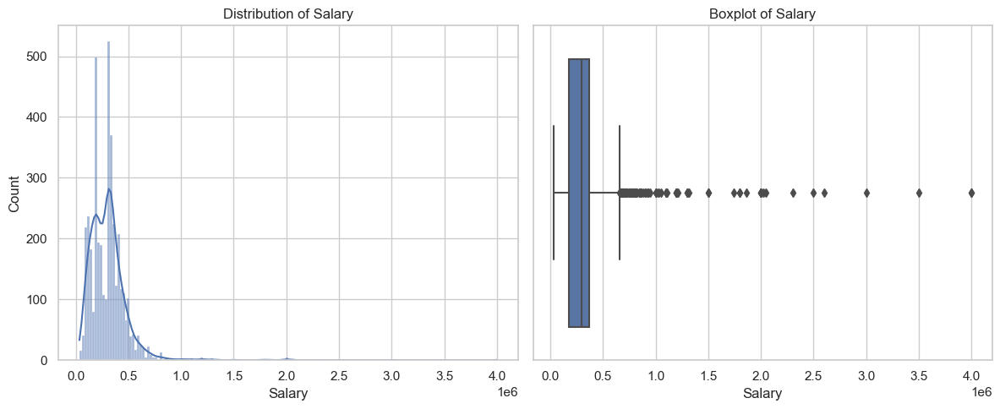

Outliers in Salary:
     Unnamed: 0       ID     Salary           DOJ          DOL  \
3         train   267447  1100000.0   7/1/11 0:00      present   
76        train   361583   800000.0   6/1/12 0:00      present   
92        train  1250429  1500000.0  11/1/14 0:00  7/1/14 0:00   
123       train   312164  1200000.0   7/1/10 0:00  7/1/11 0:00   
128       train   206734   675000.0  11/1/11 0:00      present   
...         ...      ...        ...           ...          ...   
3823      train   918568   775000.0   8/1/14 0:00      present   
3904      train   267121   850000.0   9/1/11 0:00      present   
3912      train   231229   730000.0   7/1/13 0:00      present   
3961      train   230702   700000.0   7/1/11 0:00  9/1/14 0:00   
3992      train   344407   800000.0   4/1/14 0:00  4/1/15 0:00   

                     Designation      JobCity Gender            DOB  \
3       senior software engineer      Gurgaon      m   12/5/89 0:00   
76             software engineer    Bangalore

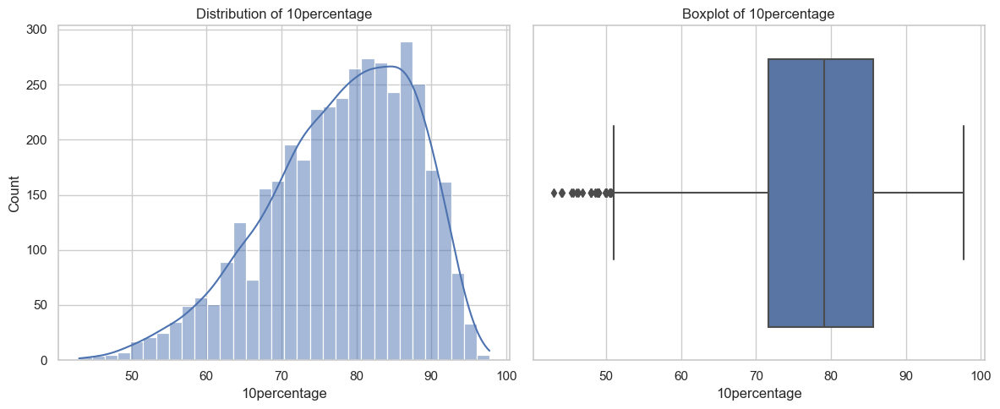

Outliers in 10percentage:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
245       train   984958  285000.0   8/1/14 0:00   4/1/15 0:00   
466       train  1245184  215000.0   1/1/15 0:00   4/1/15 0:00   
490       train   302937  150000.0   7/1/11 0:00  11/1/12 0:00   
491       train    53838  100000.0   5/1/10 0:00   1/1/11 0:00   
502       train  1160766  240000.0   1/1/15 0:00   4/1/15 0:00   
600       train   918414  200000.0  11/1/08 0:00  11/1/12 0:00   
613       train   228081  440000.0   5/1/13 0:00       present   
898       train   212005  270000.0   3/1/13 0:00       present   
919       train  1231953  450000.0   7/1/14 0:00   6/1/15 0:00   
1064      train   277260  250000.0   9/1/11 0:00  12/1/14 0:00   
1102      train   311098  120000.0  12/1/12 0:00   1/1/15 0:00   
1169      train   179878  105000.0   1/1/11 0:00   6/1/11 0:00   
1193      train   309190  180000.0  12/1/12 0:00  12/1/13 0:00   
1235      train   325701  115000.0  11/1/12 0:00  

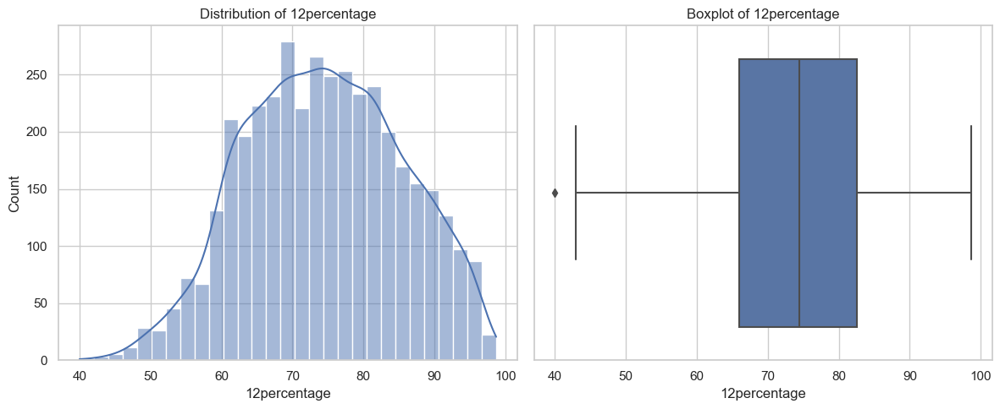

Outliers in 12percentage:
     Unnamed: 0      ID    Salary          DOJ          DOL  \
3337      train  258677  300000.0  9/1/10 0:00  6/1/14 0:00   

               Designation    JobCity Gender           DOB  10percentage  ...  \
3337  system administrator  Hyderabad      m  6/21/84 0:00          74.0  ...   

     ComputerScience  MechanicalEngg  ElectricalEngg TelecomEngg  CivilEngg  \
3337              -1              -1              -1          -1         -1   

      conscientiousness agreeableness extraversion  nueroticism  \
3337             -0.881        0.0328      -1.5051      -0.2902   

      openess_to_experience  
3337                -0.9194  

[1 rows x 39 columns]


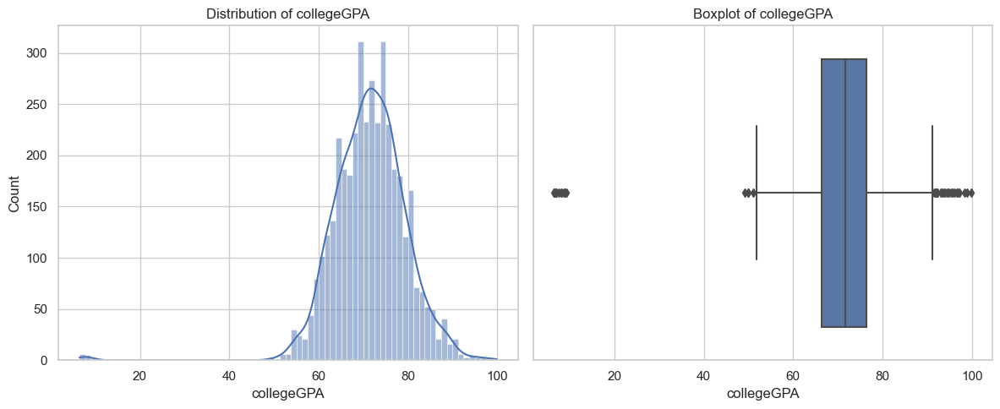

Outliers in collegeGPA:
     Unnamed: 0       ID     Salary           DOJ           DOL  \
7         train   912934   400000.0   7/1/14 0:00   7/1/15 0:00   
44        train   247617   380000.0   5/1/12 0:00   4/1/15 0:00   
138       train   964319   195000.0  10/1/14 0:00   1/1/15 0:00   
187       train   336792   410000.0   2/1/13 0:00       present   
477       train   345838   225000.0   6/1/13 0:00   4/1/15 0:00   
614       train   237941   655000.0   7/1/11 0:00       present   
690       train   609356   440000.0  10/1/13 0:00   4/1/15 0:00   
788       train   249853   180000.0   5/1/12 0:00   6/1/13 0:00   
874       train   337594   400000.0   2/1/13 0:00   4/1/15 0:00   
907       train   324190   100000.0   2/1/13 0:00   4/1/14 0:00   
1029      train   337629   300000.0   4/1/13 0:00   4/1/15 0:00   
1134      train    56871   350000.0   4/1/10 0:00   8/1/12 0:00   
1264      train   220634   500000.0   8/1/11 0:00   6/1/12 0:00   
1345      train   619658   460000.0   

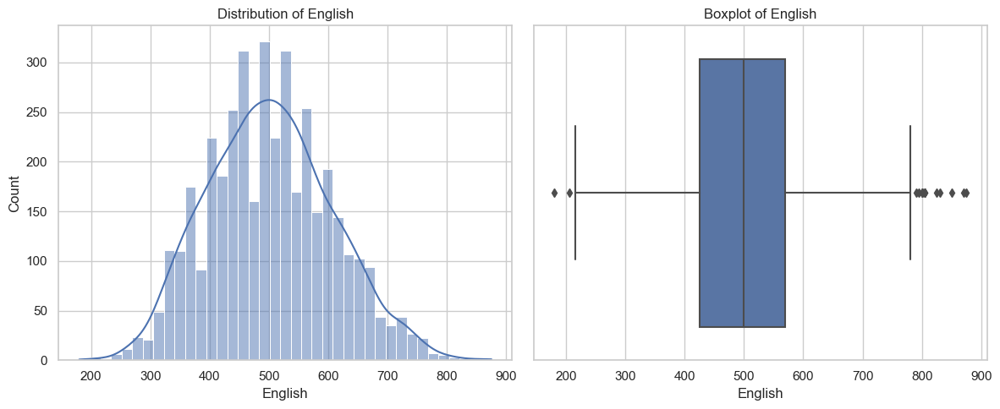

Outliers in English:
     Unnamed: 0       ID    Salary           DOJ          DOL  \
275       train  1023622  305000.0   8/1/14 0:00      present   
444       train   283164  715000.0   1/1/12 0:00      present   
668       train   609043  440000.0  10/1/13 0:00      present   
839       train   693533  315000.0   8/1/13 0:00  2/1/15 0:00   
847       train   608938  600000.0   7/1/13 0:00  6/1/14 0:00   
935       train   513149  150000.0   9/1/12 0:00  8/1/13 0:00   
1183      train  1083037  310000.0   9/1/14 0:00      present   
1217      train   669692  600000.0  10/1/14 0:00  2/1/15 0:00   
1450      train  1284437  200000.0   1/1/15 0:00  7/1/15 0:00   
1519      train   984550  320000.0  10/1/14 0:00      present   
2077      train   922684  305000.0   9/1/14 0:00  4/1/15 0:00   
2122      train   605290  180000.0   4/1/12 0:00  2/1/13 0:00   
2385      train   683102  325000.0   2/1/14 0:00      present   
2596      train  1088319  610000.0   7/1/14 0:00  4/1/15 0:00   
3044

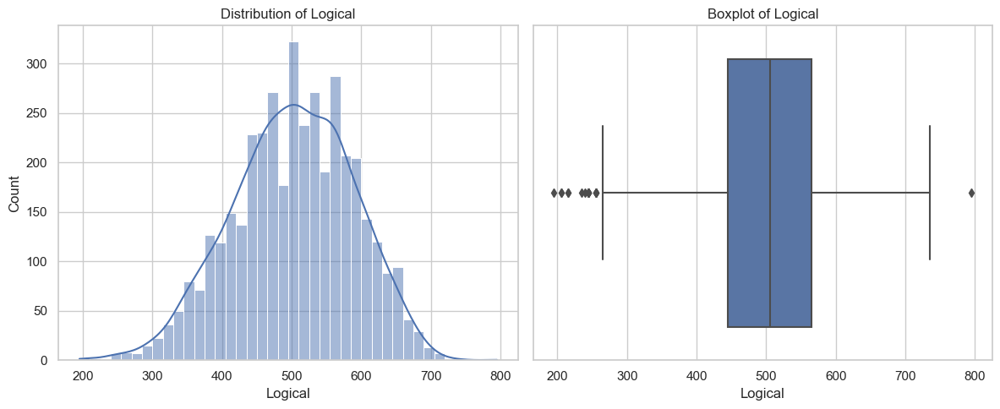

Outliers in Logical:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
101       train    43693  205000.0  12/1/11 0:00       present   
133       train   434552  300000.0   6/1/14 0:00   4/1/15 0:00   
207       train   457244  360000.0   4/1/13 0:00       present   
345       train    60315  110000.0   7/1/11 0:00   5/1/12 0:00   
628       train    47805  505000.0  12/1/10 0:00   6/1/14 0:00   
1014      train   649530  350000.0   2/1/14 0:00       present   
1160      train    65483  325000.0   4/1/12 0:00       present   
1439      train   299447  360000.0   8/1/11 0:00       present   
2141      train   340045  100000.0   4/1/13 0:00   9/1/13 0:00   
2265      train   126975  300000.0   9/1/10 0:00  10/1/13 0:00   
2796      train  1087183  100000.0   2/1/15 0:00   3/1/15 0:00   
2830      train   133458  150000.0  10/1/10 0:00  12/1/11 0:00   
2891      train   205633  500000.0   9/1/11 0:00       present   
3119      train   961011   95000.0   4/1/14 0:00   4/1/

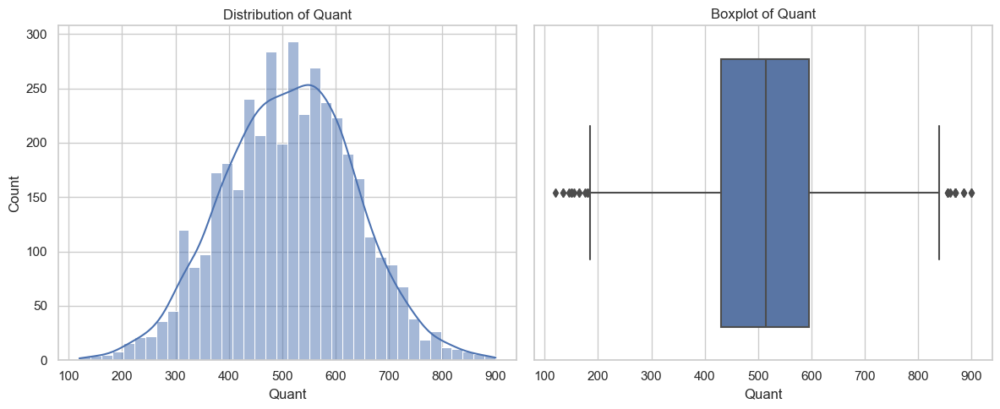

Outliers in Quant:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
195       train   863466  350000.0  11/1/13 0:00   7/1/14 0:00   
522       train   640774   55000.0   2/1/14 0:00   5/1/14 0:00   
564       train   558050  185000.0   8/1/12 0:00   8/1/15 0:00   
698       train  1122860  300000.0   8/1/14 0:00       present   
783       train  1262957  190000.0  11/1/13 0:00   1/1/15 0:00   
899       train   602267  320000.0   9/1/14 0:00       present   
1148      train  1145718  100000.0  11/1/14 0:00   1/1/15 0:00   
1310      train   596083  450000.0   8/1/14 0:00       present   
1661      train   591405  605000.0   9/1/13 0:00       present   
1815      train   806357  205000.0   7/1/14 0:00   6/1/15 0:00   
2007      train   637441  350000.0  10/1/13 0:00   4/1/15 0:00   
2134      train   602029  150000.0  10/1/14 0:00   9/1/15 0:00   
2155      train   900799  320000.0   5/1/14 0:00       present   
2411      train   655464  390000.0   7/1/13 0:00       pr

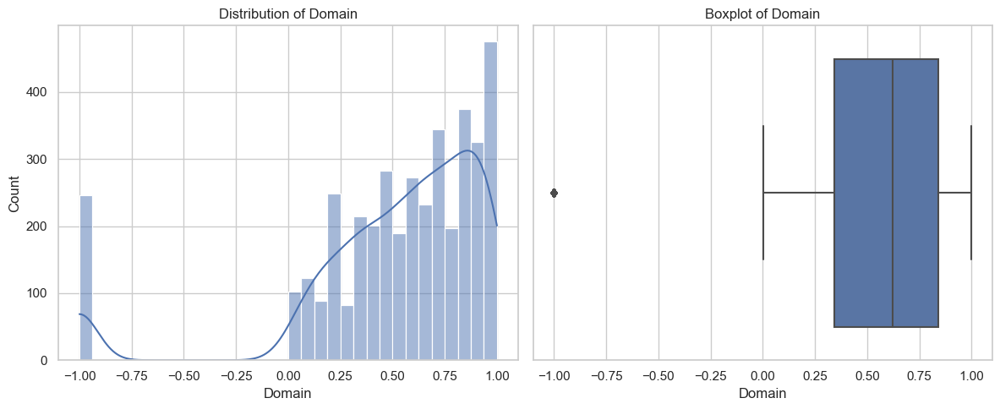

Outliers in Domain:
     Unnamed: 0       ID    Salary           DOJ          DOL  \
5         train  1027655  300000.0   6/1/14 0:00      present   
14        train  1279958  300000.0   7/1/13 0:00      present   
16        train  1087625  325000.0   9/1/14 0:00      present   
22        train   995191  190000.0  10/1/13 0:00  4/1/15 0:00   
35        train   942679  350000.0   3/1/14 0:00      present   
...         ...      ...       ...           ...          ...   
3942      train  1067015  280000.0   7/1/13 0:00      present   
3958      train  1039020  310000.0   6/1/14 0:00      present   
3960      train  1037712  240000.0   8/1/13 0:00  1/1/14 0:00   
3969      train  1233826  330000.0   6/1/15 0:00      present   
3978      train  1274658  320000.0   8/1/13 0:00  1/1/14 0:00   

                       Designation    JobCity Gender           DOB  \
5                  system engineer  Hyderabad      m   7/2/92 0:00   
14          java software engineer  Bangalore      m   7/2/

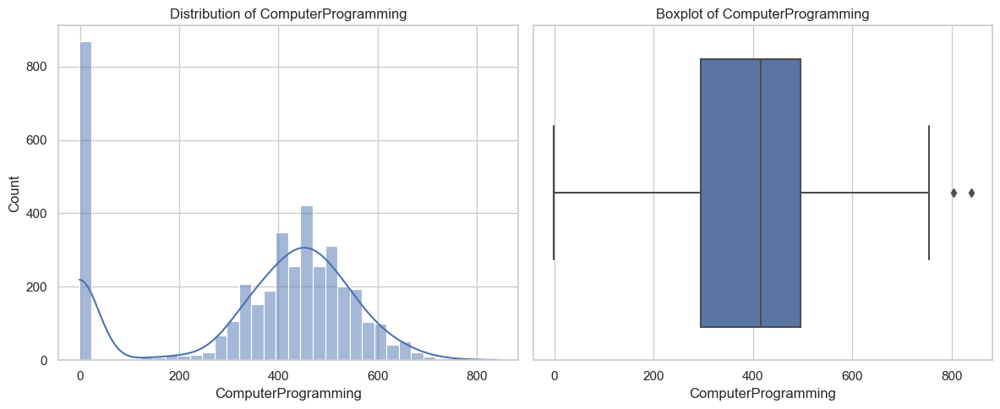

Outliers in ComputerProgramming:
     Unnamed: 0      ID    Salary          DOJ          DOL  \
64        train   31330  600000.0  7/1/10 0:00  7/1/12 0:00   
1711      train  712570  625000.0  2/1/14 0:00      present   

                 Designation  JobCity Gender           DOB  10percentage  ...  \
64    java software engineer  Gurgaon      m  5/29/86 0:00          78.0  ...   
1711            data analyst       -1      m  6/24/90 0:00          88.0  ...   

     ComputerScience  MechanicalEngg  ElectricalEngg TelecomEngg  CivilEngg  \
64                -1              -1              -1          -1         -1   
1711              -1             233              -1          -1         -1   

      conscientiousness agreeableness extraversion  nueroticism  \
64               0.6646        0.3448       0.8171       0.6498   
1711            -0.7335       -0.7866      -0.4511      -1.5021   

      openess_to_experience  
64                   0.0284  
1711                -1.8189  

[2

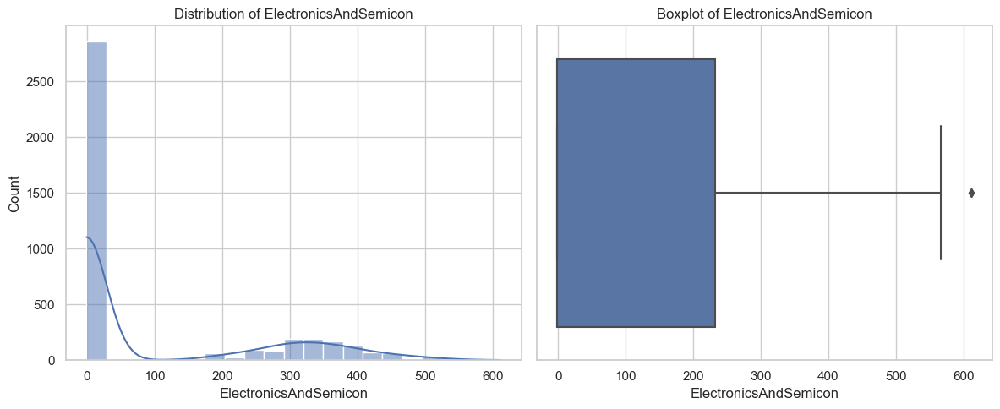

Outliers in ElectronicsAndSemicon:
     Unnamed: 0       ID    Salary           DOJ          DOL  \
1557      train  1157412  350000.0   7/1/14 0:00  4/1/15 0:00   
3889      train  1062520  325000.0  10/1/14 0:00      present   

                  Designation    JobCity Gender           DOB  10percentage  \
1557         systems engineer  Hyderabad      f  8/11/92 0:00          84.4   
3889  assistant store manager    Chennai      m  8/28/93 0:00          93.4   

      ... ComputerScience  MechanicalEngg  ElectricalEngg TelecomEngg  \
1557  ...              -1              -1             580          -1   
3889  ...              -1              -1              -1          -1   

      CivilEngg  conscientiousness agreeableness extraversion  nueroticism  \
1557         -1             1.8517        1.0449        0.010      -2.3895   
3889         -1             0.1282        0.3789       -1.527      -0.8682   

      openess_to_experience  
1557                 0.8637  
3889            

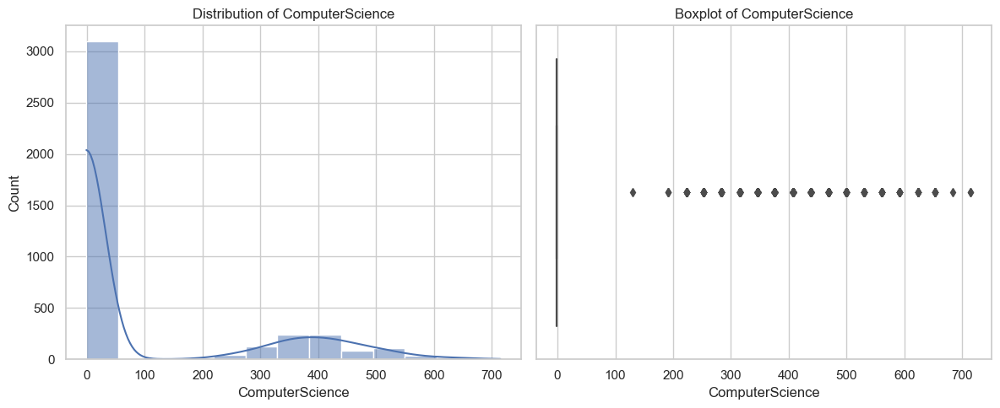

Outliers in ComputerScience:
     Unnamed: 0       ID    Salary          DOJ          DOL  \
5         train  1027655  300000.0  6/1/14 0:00      present   
6         train   947847  300000.0  8/1/14 0:00  5/1/15 0:00   
14        train  1279958  300000.0  7/1/13 0:00      present   
17        train   874596  250000.0  8/1/13 0:00  9/1/14 0:00   
24        train   963123  335000.0  6/1/14 0:00  6/1/15 0:00   
...         ...      ...       ...          ...          ...   
3972      train  1044603  180000.0  3/1/15 0:00  5/1/15 0:00   
3976      train  1006997  300000.0  1/1/15 0:00      present   
3981      train  1077872  220000.0  9/1/14 0:00      present   
3989      train  1204604  300000.0  9/1/14 0:00      present   
3996      train   947111  200000.0  7/1/14 0:00  1/1/15 0:00   

                       Designation           JobCity Gender            DOB  \
5                  system engineer         Hyderabad      m    7/2/92 0:00   
6           java software engineer          Ba

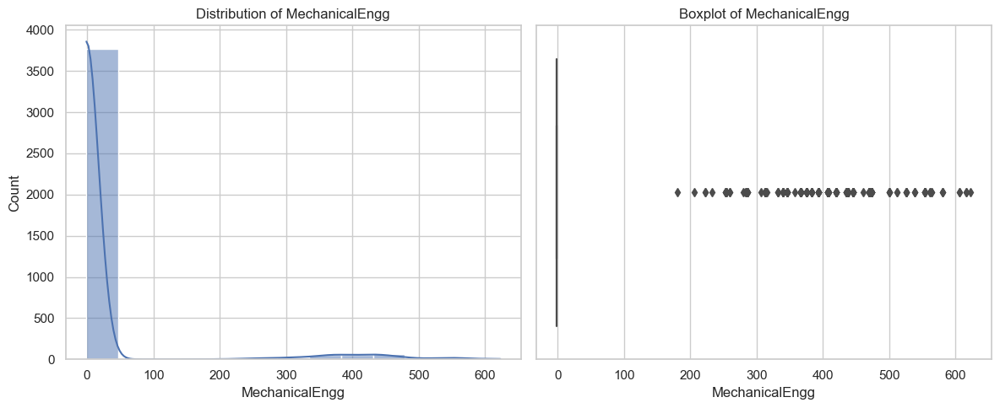

Outliers in MechanicalEngg:
     Unnamed: 0       ID    Salary          DOJ           DOL  \
7         train   912934  400000.0  7/1/14 0:00   7/1/15 0:00   
26        train    65096  345000.0  1/1/11 0:00  10/1/13 0:00   
40        train   245887  120000.0  6/1/11 0:00   3/1/12 0:00   
45        train  1230582  110000.0  9/1/14 0:00   1/1/15 0:00   
59        train   536053  120000.0  9/1/09 0:00   4/1/13 0:00   
...         ...      ...       ...          ...           ...   
3909      train   628271  210000.0  8/1/13 0:00       present   
3916      train   530146  360000.0  6/1/13 0:00  12/1/14 0:00   
3929      train   336937  100000.0  6/1/12 0:00   4/1/14 0:00   
3951      train   885459  145000.0  5/1/14 0:00       present   
3980      train   197796  150000.0  7/1/11 0:00   7/1/12 0:00   

                   Designation      JobCity Gender            DOB  \
7          mechanical engineer    Bangalore      m   5/27/92 0:00   
26    senior software engineer    Bangalore      m   

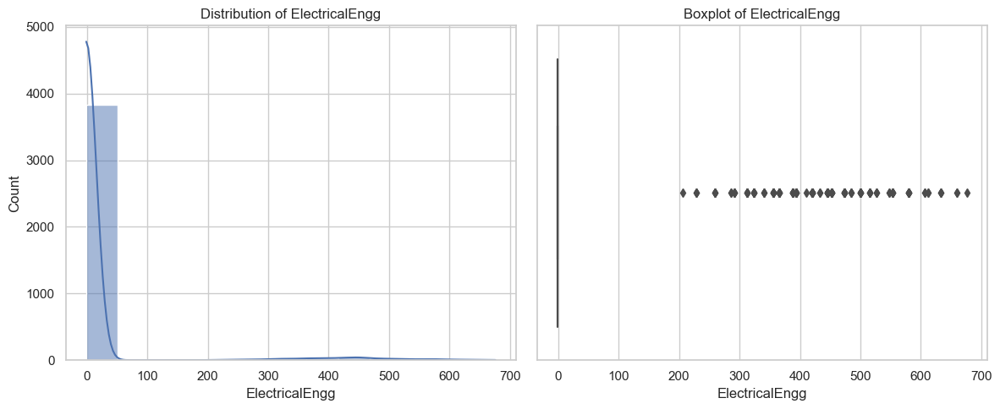

Outliers in ElectricalEngg:
     Unnamed: 0       ID    Salary           DOJ          DOL  \
53        train  1082717  350000.0   9/1/14 0:00      present   
70        train   801755  320000.0   3/1/14 0:00      present   
124       train   614524  315000.0  11/1/14 0:00      present   
125       train   796063  300000.0  11/1/14 0:00  3/1/15 0:00   
180       train   639785  180000.0   9/1/13 0:00  4/1/14 0:00   
...         ...      ...       ...           ...          ...   
3832      train   625434  565000.0  10/1/13 0:00  4/1/15 0:00   
3835      train  1081640  100000.0   4/1/14 0:00  2/1/15 0:00   
3837      train   898548  350000.0  12/1/14 0:00      present   
3839      train   644828  360000.0   9/1/13 0:00      present   
3844      train  1219891  200000.0   1/1/15 0:00  6/1/15 0:00   

                    Designation      JobCity Gender            DOB  \
53    assistant system engineer       Mumbai      m    8/6/91 0:00   
70              system engineer      Chennai      m

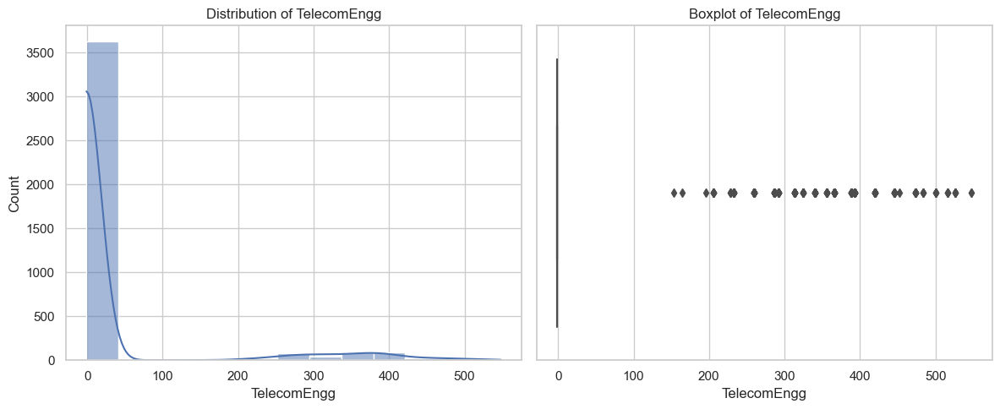

Outliers in TelecomEngg:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
12        train   606655  270000.0  12/1/13 0:00       present   
28        train   918981  145000.0   2/1/15 0:00   4/1/15 0:00   
57        train   294700  525000.0   3/1/12 0:00       present   
62        train  1218578  145000.0   6/1/14 0:00       present   
81        train   661546  280000.0  10/1/14 0:00   4/1/15 0:00   
...         ...      ...       ...           ...           ...   
3937      train   385546  205000.0  10/1/12 0:00   2/1/14 0:00   
3938      train   340205  300000.0   5/1/14 0:00       present   
3954      train   531726  310000.0   4/1/14 0:00   4/1/15 0:00   
3990      train   204287  480000.0   2/1/12 0:00       present   
3991      train   230873  630000.0   7/1/11 0:00  10/1/14 0:00   

                        Designation    JobCity Gender            DOB  \
12       quality assurance engineer       Pune      m  11/21/90 0:00   
28       telecommunication engineer   

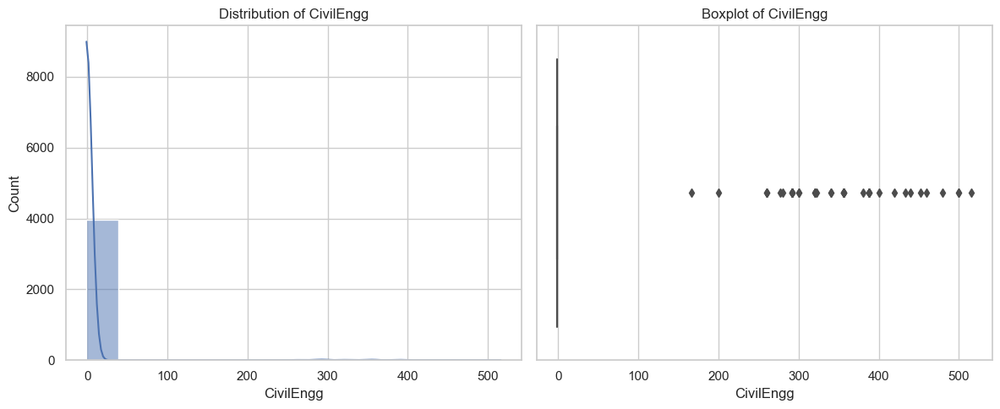

Outliers in CivilEngg:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
26        train    65096  345000.0   1/1/11 0:00  10/1/13 0:00   
59        train   536053  120000.0   9/1/09 0:00   4/1/13 0:00   
172       train  1089283  110000.0   6/1/14 0:00   2/1/15 0:00   
211       train    46302  350000.0  10/1/10 0:00   5/1/13 0:00   
222       train   226736  100000.0   3/1/13 0:00   6/1/13 0:00   
331       train   341114  700000.0   4/1/14 0:00       present   
403       train   795799  405000.0   7/1/14 0:00       present   
453       train  1253724  300000.0   6/1/15 0:00       present   
492       train   795862  525000.0   9/1/14 0:00       present   
493       train   609066  720000.0   2/1/14 0:00       present   
505       train   112626  500000.0   8/1/11 0:00       present   
605       train   319130  350000.0   6/1/12 0:00   4/1/15 0:00   
607       train   642404  600000.0   7/1/13 0:00       present   
896       train   285145  300000.0   6/1/12 0:00   9/

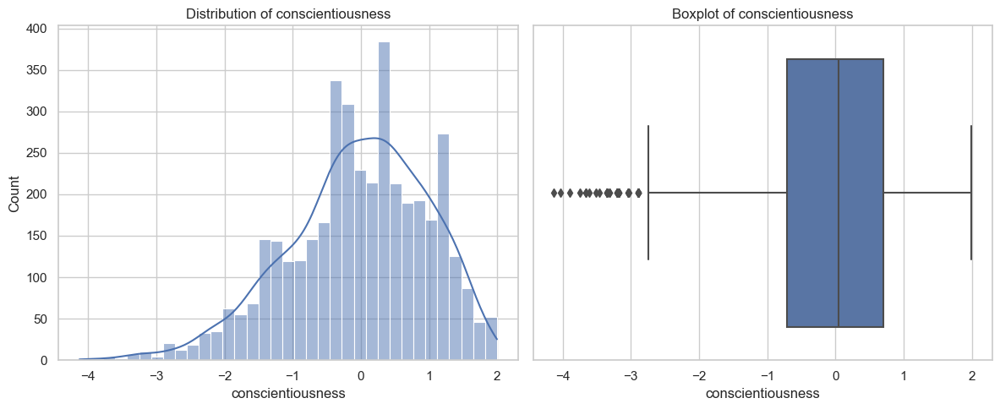

Outliers in conscientiousness:
     Unnamed: 0       ID     Salary           DOJ           DOL  \
29        train   472956   220000.0  11/1/14 0:00   4/1/14 0:00   
159       train   755080   340000.0   6/1/14 0:00   4/1/15 0:00   
210       train    30739   310000.0   9/1/10 0:00   3/1/12 0:00   
315       train   232430   360000.0   5/1/12 0:00       present   
335       train  1042343   120000.0   2/1/14 0:00       present   
373       train   215639   370000.0   3/1/14 0:00       present   
382       train    50739   260000.0   3/1/11 0:00       present   
408       train  1175511   280000.0   2/1/15 0:00   7/1/15 0:00   
468       train  1073243   240000.0   7/1/13 0:00       present   
523       train  1061906   120000.0   3/1/14 0:00   4/1/15 0:00   
1211      train   632729   420000.0   8/1/13 0:00       present   
1337      train   355018   285000.0   2/1/13 0:00       present   
1353      train   578644   350000.0   6/1/13 0:00       present   
1684      train   455020   4500

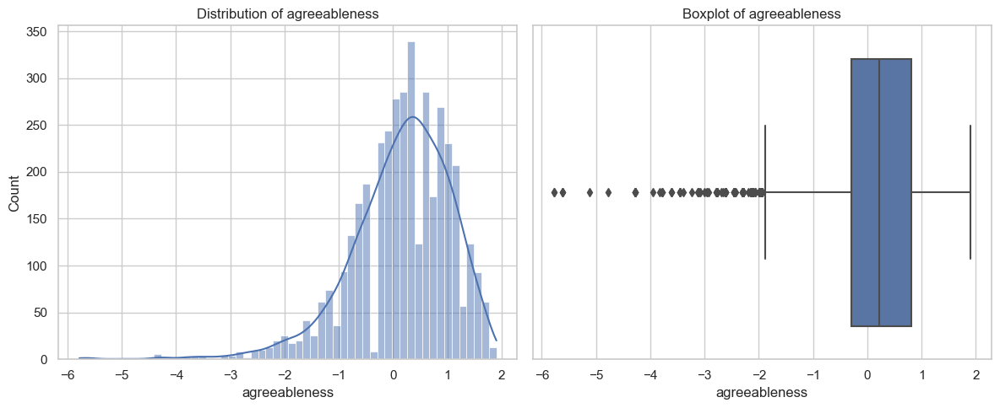

Outliers in agreeableness:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
23        train   990077  180000.0   8/1/14 0:00   4/1/15 0:00   
43        train  1207660  120000.0   4/1/14 0:00   4/1/15 0:00   
63        train   636871  150000.0  10/1/14 0:00   4/1/15 0:00   
67        train   810433  400000.0   8/1/14 0:00   2/1/15 0:00   
157       train   728009  405000.0   8/1/13 0:00       present   
...         ...      ...       ...           ...           ...   
3843      train   661427  240000.0   8/1/13 0:00   8/1/13 0:00   
3855      train   530061  300000.0   9/1/14 0:00       present   
3878      train   663824  260000.0  10/1/13 0:00       present   
3939      train   716325  100000.0   7/1/13 0:00  12/1/14 0:00   
3953      train   331779  160000.0   5/1/13 0:00       present   

                      Designation     JobCity Gender           DOB  \
23    electrical project engineer   Bangalore      m  7/30/86 0:00   
43                 .net developer  Hyder

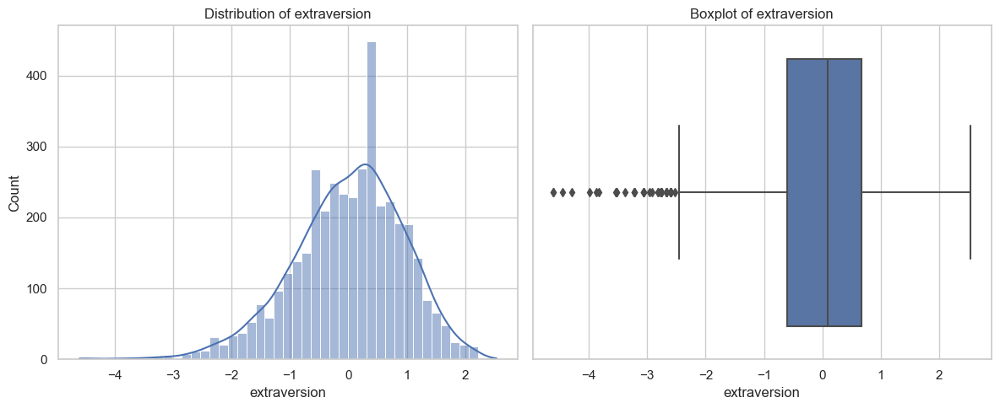

Outliers in extraversion:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
63        train   636871  150000.0  10/1/14 0:00   4/1/15 0:00   
159       train   755080  340000.0   6/1/14 0:00   4/1/15 0:00   
335       train  1042343  120000.0   2/1/14 0:00       present   
408       train  1175511  280000.0   2/1/15 0:00   7/1/15 0:00   
523       train  1061906  120000.0   3/1/14 0:00   4/1/15 0:00   
666       train   820152  110000.0   1/1/14 0:00       present   
726       train   471413  480000.0   7/1/13 0:00   4/1/15 0:00   
1169      train   179878  105000.0   1/1/11 0:00   6/1/11 0:00   
1211      train   632729  420000.0   8/1/13 0:00       present   
1217      train   669692  600000.0  10/1/14 0:00   2/1/15 0:00   
1242      train   319644  395000.0   6/1/12 0:00   4/1/15 0:00   
1353      train   578644  350000.0   6/1/13 0:00       present   
1538      train   800117  105000.0  12/1/14 0:00   3/1/15 0:00   
1566      train   638264  180000.0   7/1/12 0:00  

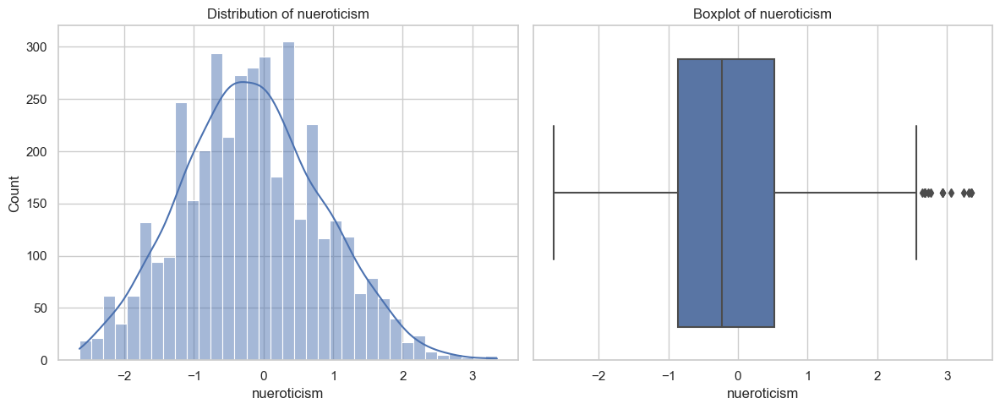

Outliers in nueroticism:
     Unnamed: 0       ID    Salary           DOJ          DOL  \
222       train   226736  100000.0   3/1/13 0:00  6/1/13 0:00   
405       train   601563  145000.0  10/1/13 0:00  7/1/14 0:00   
1151      train   346395  140000.0   7/1/12 0:00  1/1/14 0:00   
1191      train   356498  445000.0   3/1/13 0:00  5/1/15 0:00   
1383      train   349752  550000.0   6/1/12 0:00      present   
1602      train   862240  180000.0   4/1/14 0:00  4/1/15 0:00   
1843      train   843714  280000.0   8/1/13 0:00      present   
2054      train   348114  335000.0   7/1/13 0:00      present   
2234      train   530441  360000.0   2/1/14 0:00      present   
2275      train  1052796  100000.0   1/1/14 0:00      present   
2608      train   914037  180000.0  10/1/14 0:00  1/1/15 0:00   
2859      train  1152368  180000.0   1/1/14 0:00  2/1/15 0:00   
3089      train   690389  180000.0   2/1/13 0:00      present   
3384      train  1264544  120000.0  10/1/14 0:00  6/1/14 0:00   


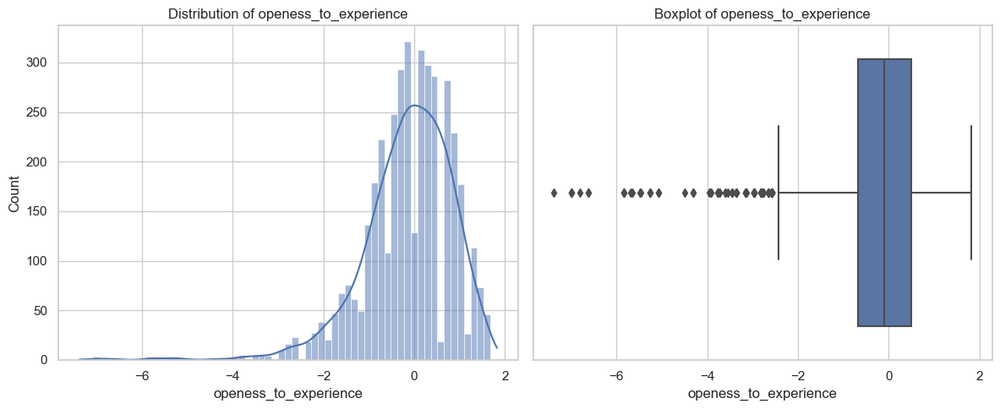

Outliers in openess_to_experience:
     Unnamed: 0       ID    Salary           DOJ           DOL  \
22        train   995191  190000.0  10/1/13 0:00   4/1/15 0:00   
23        train   990077  180000.0   8/1/14 0:00   4/1/15 0:00   
43        train  1207660  120000.0   4/1/14 0:00   4/1/15 0:00   
63        train   636871  150000.0  10/1/14 0:00   4/1/15 0:00   
128       train   206734  675000.0  11/1/11 0:00       present   
...         ...      ...       ...           ...           ...   
3868      train   618243  320000.0   6/1/13 0:00       present   
3892      train  1089287  300000.0   8/1/14 0:00       present   
3901      train   677204  390000.0   7/1/13 0:00   4/1/15 0:00   
3918      train   988486  120000.0   8/1/14 0:00       present   
3957      train   425242  180000.0   9/1/12 0:00  10/1/13 0:00   

                         Designation     JobCity Gender           DOB  \
22                         developer   Hyderabad      m  1/23/92 0:00   
23       electrical projec

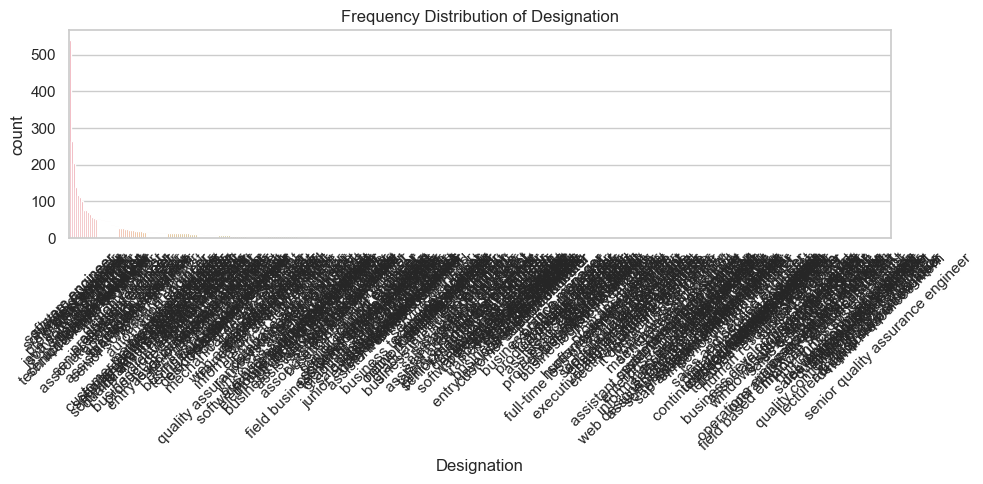

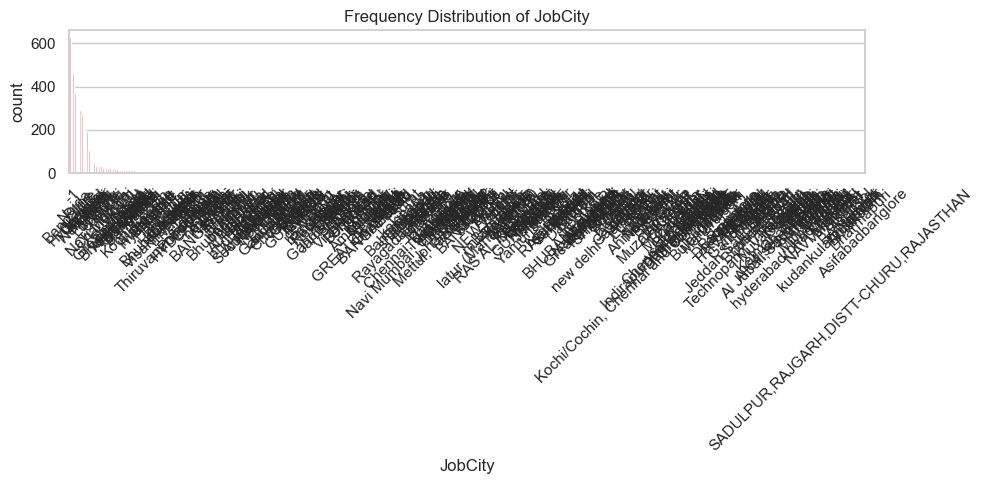

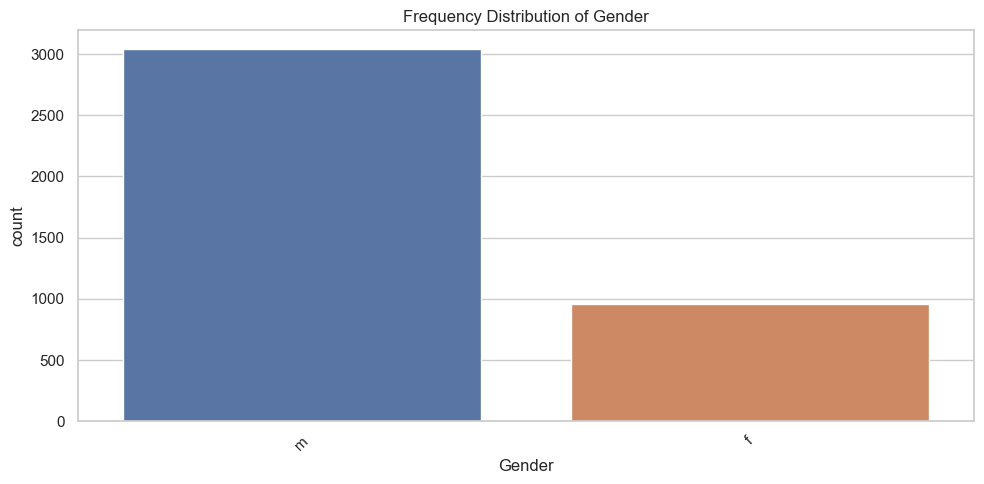

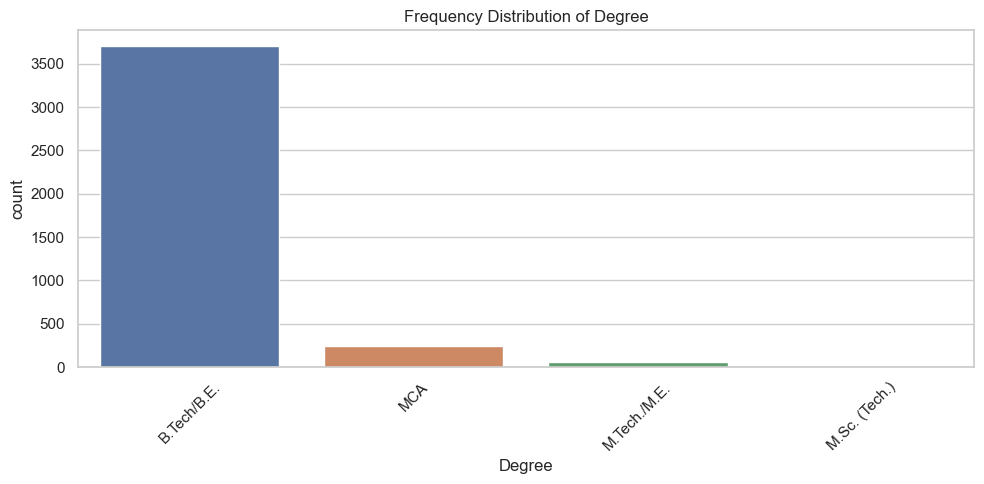

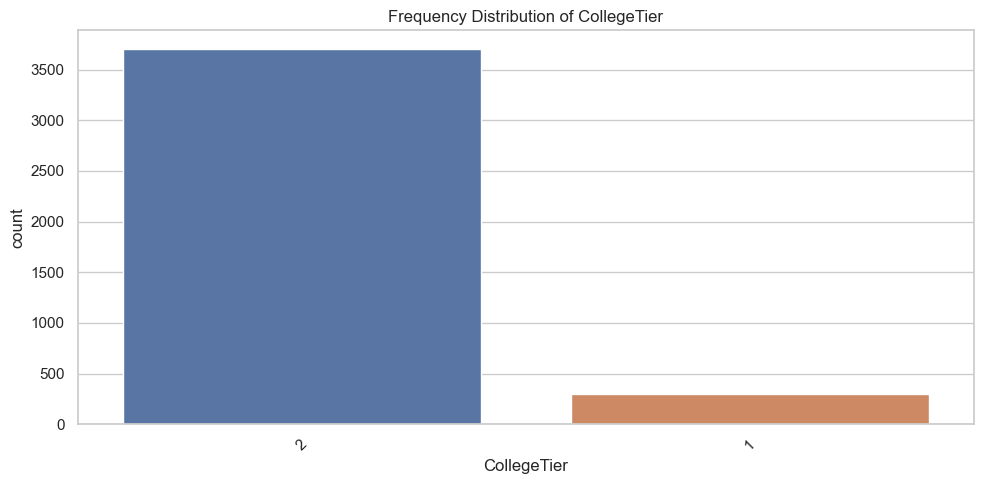

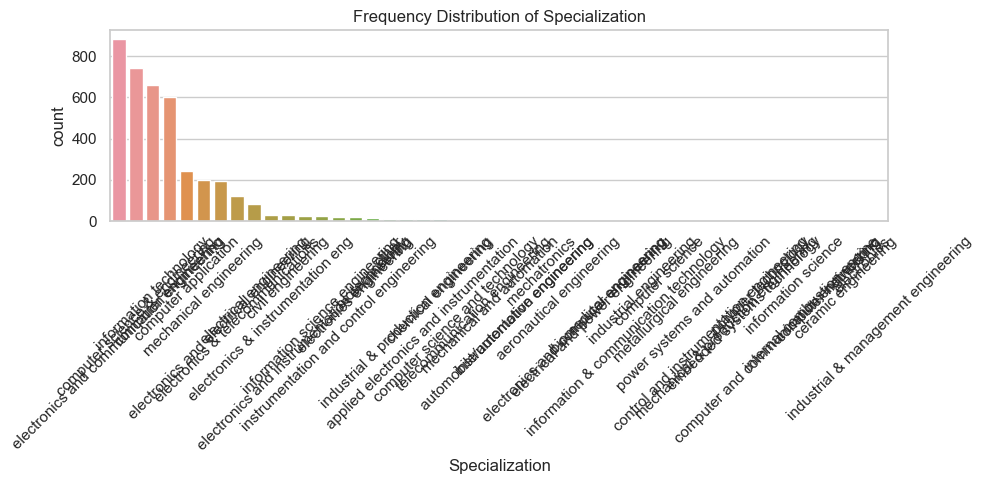

Summary of Observations:
1. Salary: The salary distribution is typically right-skewed, with most graduates earning lower salaries. Outliers may represent high-earning positions in lucrative sectors.
2. Academic Performance: High percentages in the 10th and 12th grades suggest that most graduates perform well academically. Outliers may indicate exceptional students.
3. Skill Scores: Skills such as Cognitive and Technical may show varied distributions, with some students excelling and others lagging behind.
4. Designation: Common job titles reflect the job market demand, with Software Engineer being predominant.
5. Job City: Some cities may have a higher concentration of job opportunities, impacting graduates' salaries.
6. Gender Distribution: Any notable imbalance in gender representation in the dataset could highlight diversity issues in engineering fields.
7. College Tier: Graduates from higher-tier colleges often have better job placements and potentially higher salaries.


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the visualisation style
sns.set(style='whitegrid')

# Define a function to calculate outliers
def find_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

# Univariate Analysis on Numerical Columns
numerical_cols = ['Salary', '10percentage', '12percentage', 'collegeGPA',
                  'English', 'Logical', 'Quant', 'Domain',
                  'ComputerProgramming', 'ElectronicsAndSemicon', 
                  'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 
                  'TelecomEngg', 'CivilEngg', 'conscientiousness', 
                  'agreeableness', 'extraversion', 'nueroticism', 
                  'openess_to_experience']

for col in numerical_cols:
    plt.figure(figsize=(12, 5))

    # Histogram and PDF
    plt.subplot(1, 2, 1)
    sns.histplot(data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    
    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()

    # Identify and print outliers
    outliers = find_outliers(data, col)
    print(f'Outliers in {col}:')
    print(outliers)

# Univariate Analysis on Categorical Columns
categorical_cols = ['Designation', 'JobCity', 'Gender', 'Degree', 
                    'CollegeTier', 'Specialization']

for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    
    # Countplot
    sns.countplot(data=data, x=col, order=data[col].value_counts().index)
    plt.title(f'Frequency Distribution of {col}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Summary Observations
print("Summary of Observations:")
print("1. Salary: The salary distribution is typically right-skewed, with most graduates earning lower salaries. Outliers may represent high-earning positions in lucrative sectors.")
print("2. Academic Performance: High percentages in the 10th and 12th grades suggest that most graduates perform well academically. Outliers may indicate exceptional students.")
print("3. Skill Scores: Skills such as Cognitive and Technical may show varied distributions, with some students excelling and others lagging behind.")
print("4. Designation: Common job titles reflect the job market demand, with Software Engineer being predominant.")
print("5. Job City: Some cities may have a higher concentration of job opportunities, impacting graduates' salaries.")
print("6. Gender Distribution: Any notable imbalance in gender representation in the dataset could highlight diversity issues in engineering fields.")
print("7. College Tier: Graduates from higher-tier colleges often have better job placements and potentially higher salaries.")


## step 4: Bivariate Analysis

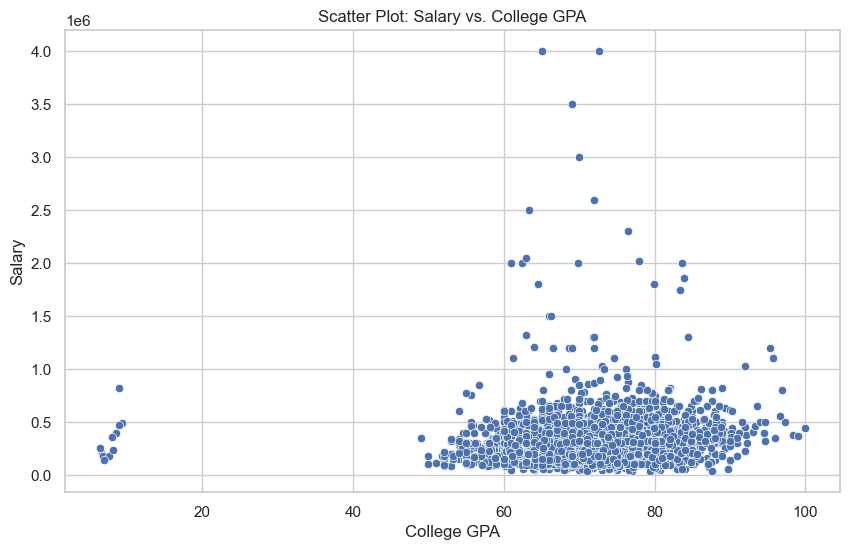

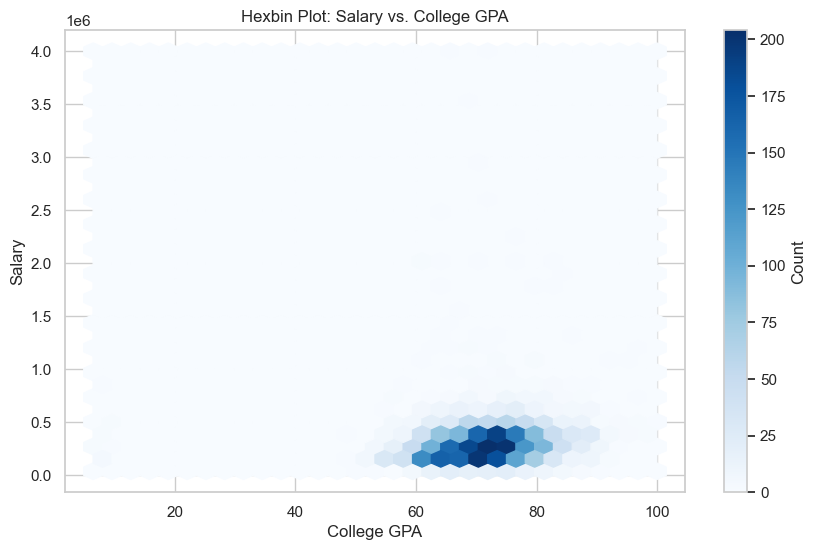

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


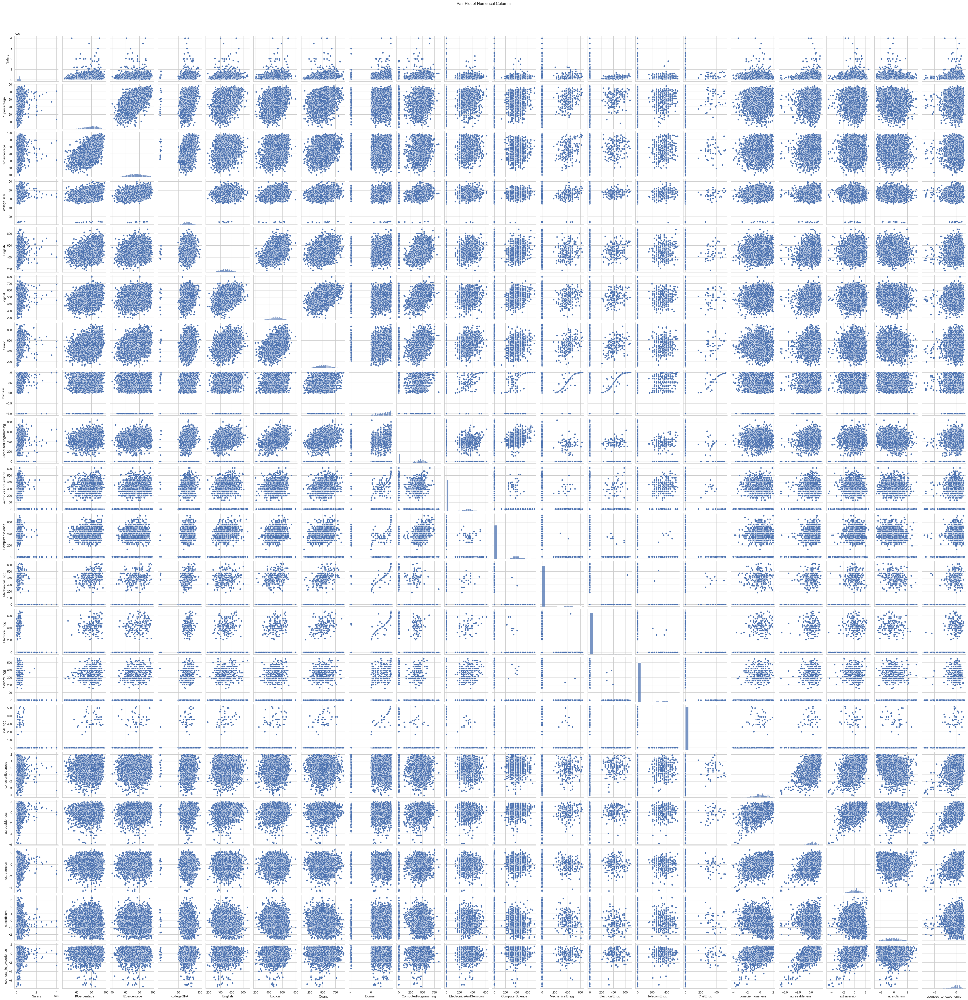

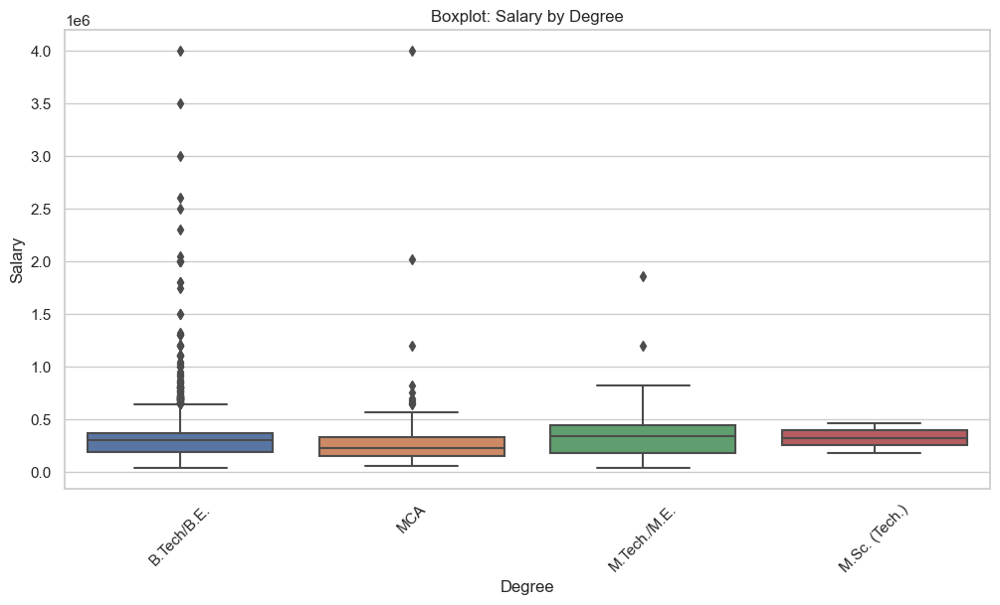

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 88.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 25.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 90.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 34.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


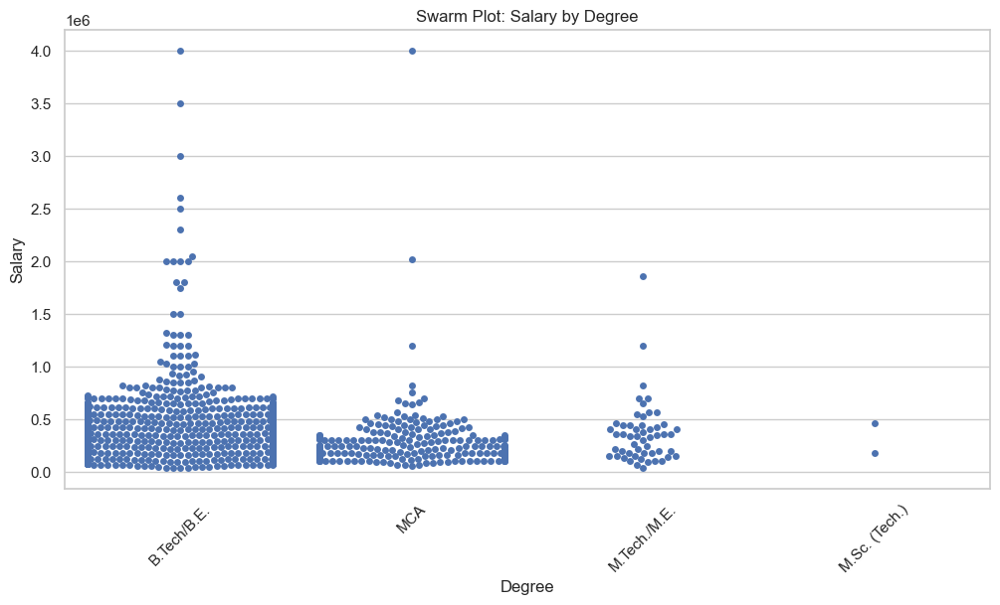

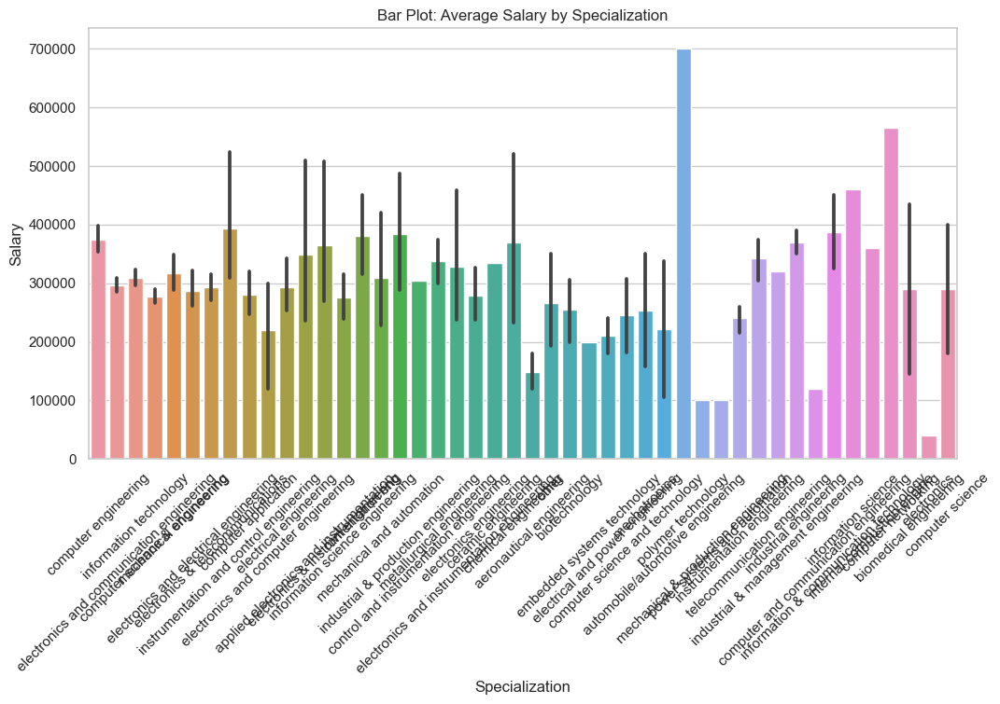

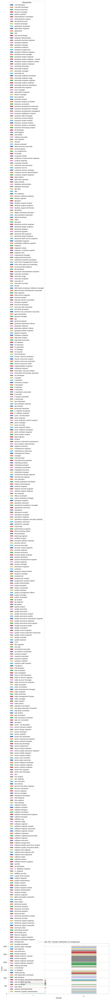

Summary of Observations:
1. Salary and College GPA: There may be a positive correlation, indicating that graduates with higher GPAs tend to earn more.
2. Salary Distributions: Boxplots and swarm plots could show that certain degrees or specializations lead to higher salaries.
3. Skill Relationships: Pair plots might reveal clusters of high-skill scores that correspond with higher salaries.
4. Gender Representation: The stacked bar plot could indicate whether certain designations have significant gender disparities.


In [8]:
# Set up the visualization style
sns.set(style='whitegrid')

# 1. Bivariate Analysis Between Numerical Columns

# Scatter Plot between Salary and collegeGPA
plt.figure(figsize=(10, 6))
sns.scatterplot(x='collegeGPA', y='Salary', data=data)
plt.title('Scatter Plot: Salary vs. College GPA')
plt.xlabel('College GPA')
plt.ylabel('Salary')
plt.show()
# Observations: Look for any correlation between college GPA and salary.

# Hexbin Plot between Salary and collegeGPA
plt.figure(figsize=(10, 6))
plt.hexbin(data['collegeGPA'], data['Salary'], gridsize=30, cmap='Blues')
plt.colorbar(label='Count')
plt.title('Hexbin Plot: Salary vs. College GPA')
plt.xlabel('College GPA')
plt.ylabel('Salary')
plt.show()
# Observations: Identifies areas with higher concentrations of data points.

# Pair Plot for Numerical Columns
numerical_cols = ['Salary', '10percentage', '12percentage', 'collegeGPA',
                  'English', 'Logical', 'Quant', 'Domain',
                  'ComputerProgramming', 'ElectronicsAndSemicon', 
                  'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 
                  'TelecomEngg', 'CivilEngg', 'conscientiousness', 
                  'agreeableness', 'extraversion', 'nueroticism', 
                  'openess_to_experience']

sns.pairplot(data[numerical_cols])
plt.suptitle('Pair Plot of Numerical Columns', y=1.02)
plt.show()
# Observations: Look for trends, clusters, or correlations among different numerical variables.

# 2. Patterns Between Categorical and Numerical Columns

# Boxplot for Salary by Degree
plt.figure(figsize=(12, 6))
sns.boxplot(x='Degree', y='Salary', data=data)
plt.title('Boxplot: Salary by Degree')
plt.xticks(rotation=45)
plt.show()
# Observations: Identifies differences in median salaries and outliers based on degree.

# Swarm Plot for Salary by Degree
plt.figure(figsize=(12, 6))
sns.swarmplot(x='Degree', y='Salary', data=data)
plt.title('Swarm Plot: Salary by Degree')
plt.xticks(rotation=45)
plt.show()
# Observations: Visualizes individual data points and clustering for different degrees.

# Bar Plot for Average Salary by Specialization
plt.figure(figsize=(12, 6))
sns.barplot(x='Specialization', y='Salary', data=data, estimator=np.mean)
plt.title('Bar Plot: Average Salary by Specialization')
plt.xticks(rotation=45)
plt.show()
# Observations: Shows which specializations have higher average salaries.

# 3. Relationships Between Categorical Columns

# Stacked Bar Plot for Gender Distribution by Designation
crosstab = pd.crosstab(data['Gender'], data['Designation'])
crosstab.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Stacked Bar Plot: Gender Distribution by Designation')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Designation')
plt.show()
# Observations: Reveals gender representation across various job titles.

# Summary of Observations
print("Summary of Observations:")
print("1. Salary and College GPA: There may be a positive correlation, indicating that graduates with higher GPAs tend to earn more.")
print("2. Salary Distributions: Boxplots and swarm plots could show that certain degrees or specializations lead to higher salaries.")
print("3. Skill Relationships: Pair plots might reveal clusters of high-skill scores that correspond with higher salaries.")
print("4. Gender Representation: The stacked bar plot could indicate whether certain designations have significant gender disparities.")

## Step 5: Research Questions

## Research Question 1: Testing Salary Claims for Computer Science Engineering Graduates

## Objective:
To test the claim that Computer Science Engineering graduates earn between 2.5 to 3 lakhs as fresh graduates in roles such as Programming Analyst, Software Engineer, Hardware Engineer, and Associate Engineer.

## Steps:
## Filter the Data: Select records of graduates who have a specialization in Computer Science Engineering and hold one of the mentioned job titles.
## Calculate Average Salary: Compute the average salary for these job titles.
## Visualize the Salary Distribution: Create visualizations to understand the salary distribution of these roles.

Average Salary for Computer Science Engineering graduates in specified roles: nan lakhs
Minimum Salary: nan lakhs, Maximum Salary: nan lakhs


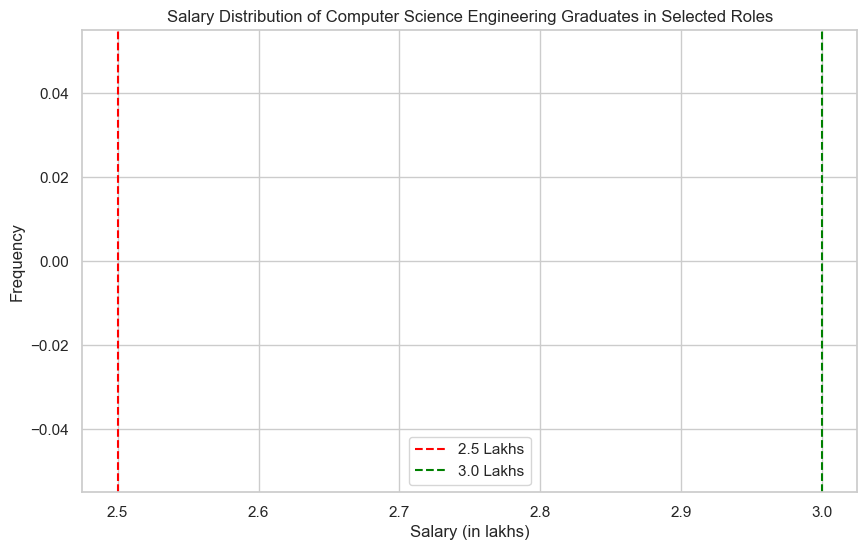

In [9]:
# Filter data for Computer Science Engineering graduates in specified job roles
cs_roles = ['Programming Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']
cs_graduates = data[(data['Specialization'] == 'Computer Science') & (data['Designation'].isin(cs_roles))]

# Calculate average salary
average_salary = cs_graduates['Salary'].mean()
salary_min = cs_graduates['Salary'].min()
salary_max = cs_graduates['Salary'].max()

print(f'Average Salary for Computer Science Engineering graduates in specified roles: {average_salary:.2f} lakhs')
print(f'Minimum Salary: {salary_min:.2f} lakhs, Maximum Salary: {salary_max:.2f} lakhs')

# Visualize Salary Distribution
plt.figure(figsize=(10, 6))
sns.histplot(cs_graduates['Salary'], bins=20, kde=True)
plt.title('Salary Distribution of Computer Science Engineering Graduates in Selected Roles')
plt.xlabel('Salary (in lakhs)')
plt.ylabel('Frequency')
plt.axvline(x=2.5, color='red', linestyle='--', label='2.5 Lakhs')
plt.axvline(x=3.0, color='green', linestyle='--', label='3.0 Lakhs')
plt.legend()
plt.show()

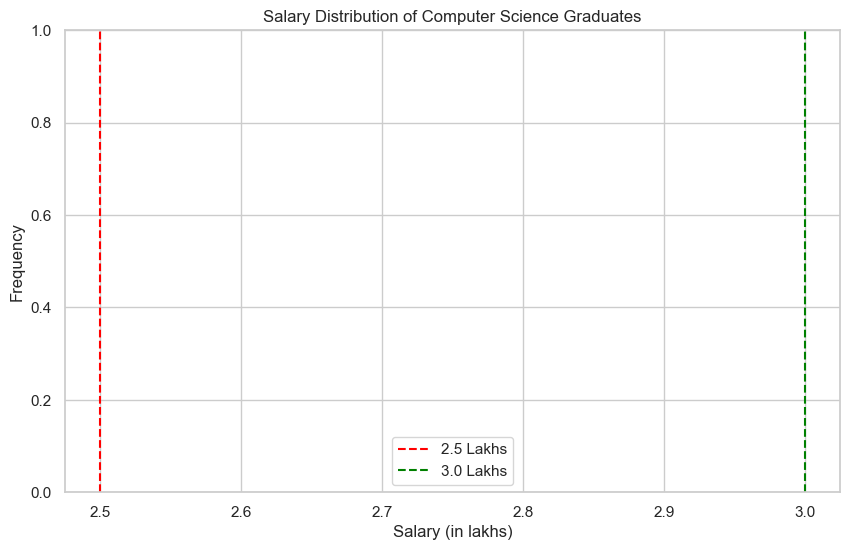

In [22]:
plt.figure(figsize=(10, 6))
sns.histplot(cs_graduates['Salary'], bins=20, kde=True, color='lightblue')
plt.title('Salary Distribution of Computer Science Graduates')
plt.xlabel('Salary (in lakhs)')
plt.ylabel('Frequency')
plt.axvline(x=2.5, color='red', linestyle='--', label='2.5 Lakhs')
plt.axvline(x=3.0, color='green', linestyle='--', label='3.0 Lakhs')
plt.legend()
plt.show()

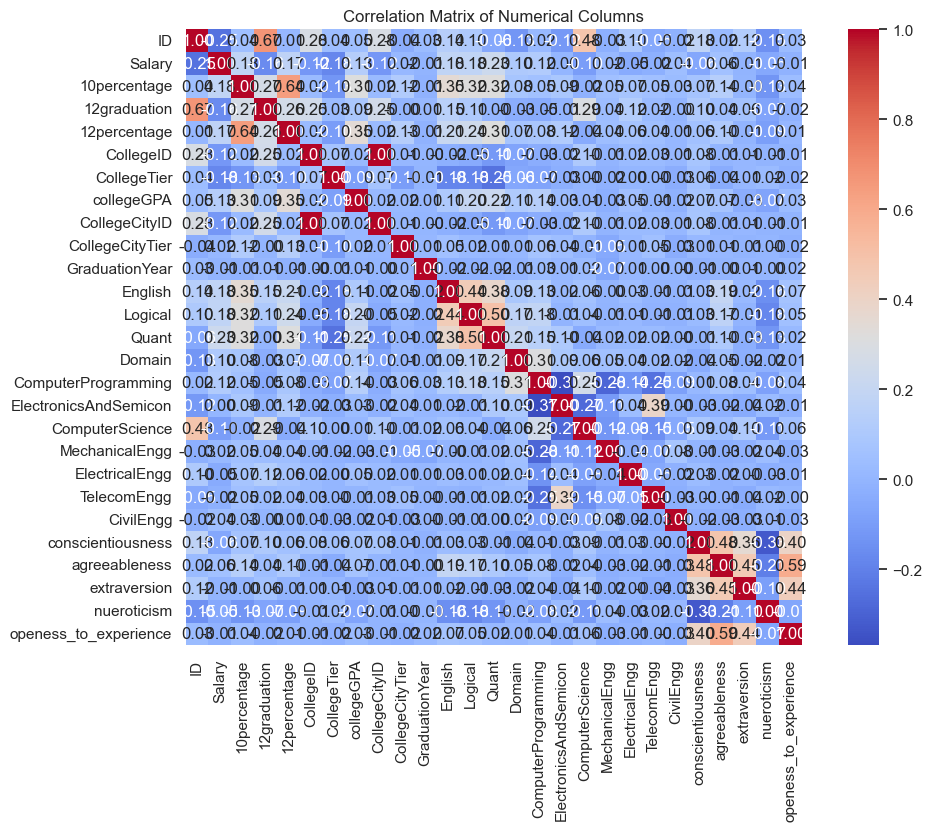

In [19]:
# Calculate correlation matrix
correlation_matrix = data[numerical_columns].corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix of Numerical Columns')
plt.show()

## Research Question 2: Relationship Between Gender and Specialization

## Objective: 
To analyze whether the preference for specialization depends on gender.

## Steps

## Cross-Tabulation: Create a cross-tabulation of Gender and Specialization.
## Stacked Bar Plot: Visualize the relationship between gender and specialization preferences.

<Figure size 1200x600 with 0 Axes>

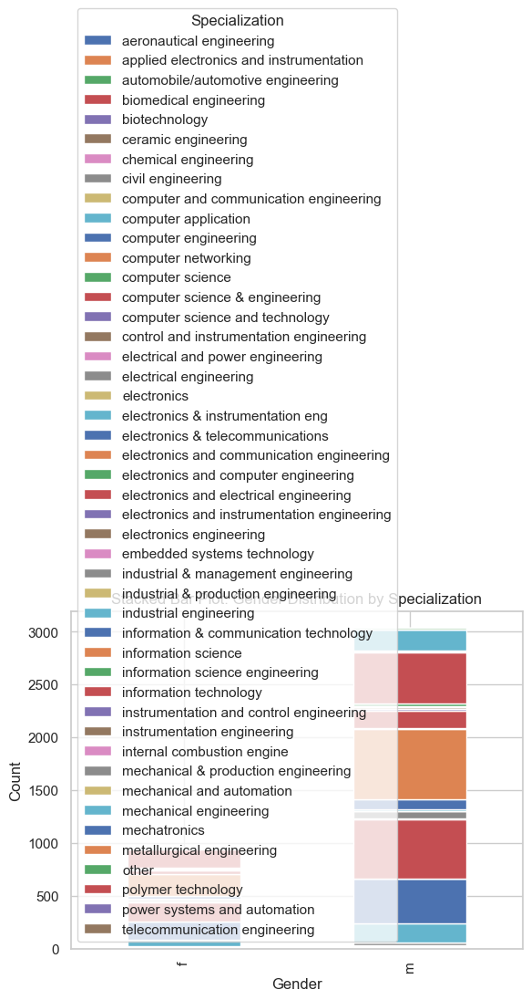

Observations for Gender and Specialization:
1. The stacked bar plot reveals how different genders are distributed across various specializations.
2. Look for trends that might indicate preferences in specialization based on gender.


In [14]:
#Create a cross-tabulation of Gender and Specialization
gender_specialization_crosstab = pd.crosstab(data['Gender'], data['Specialization'])

# Stacked Bar Plot
plt.figure(figsize=(12, 6))
gender_specialization_crosstab.plot(kind='bar', stacked=True)
plt.title('Stacked Bar Plot: Gender Distribution by Specialization')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Specialization')
plt.show()

# Observations
print("Observations for Gender and Specialization:")
print("1. The stacked bar plot reveals how different genders are distributed across various specializations.")
print("2. Look for trends that might indicate preferences in specialization based on gender.")

Specialization  aeronautical engineering  \
Gender                                     
f                                      1   
m                                      2   

Specialization  applied electronics and instrumentation  \
Gender                                                    
f                                                     2   
m                                                     7   

Specialization  automobile/automotive engineering  biomedical engineering  \
Gender                                                                      
f                                               0                       2   
m                                               5                       0   

Specialization  biotechnology  ceramic engineering  chemical engineering  \
Gender                                                                     
f                           9                    0                     1   
m                           6                    

C:\Users\navee\AppData\Local\Temp\ipykernel_4444\2120318507.py:17: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


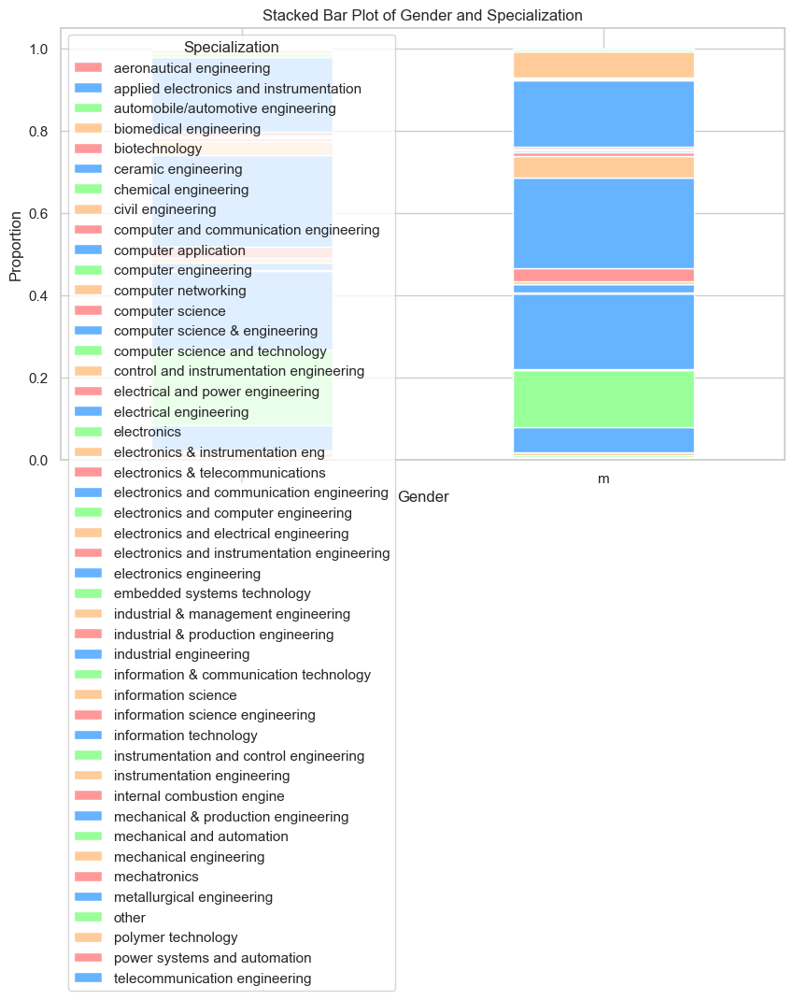

In [24]:
# Step 1: Cross-Tabulation
crosstab_gender_specialization = pd.crosstab(data['Gender'], data['Specialization'])
print(crosstab_gender_specialization)

# Step 2: Stacked Bar Plot
# Normalize the crosstab to get proportions
crosstab_normalized = crosstab_gender_specialization.div(crosstab_gender_specialization.sum(axis=1), axis=0)

# Plotting
plt.figure(figsize=(10, 6))
crosstab_normalized.plot(kind='bar', stacked=True, color=['#FF9999', '#66B3FF', '#99FF99', '#FFCC99'], ax=plt.gca())
plt.title('Stacked Bar Plot of Gender and Specialization')
plt.xlabel('Gender')
plt.ylabel('Proportion')
plt.legend(title='Specialization', loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

## Step 6: Conclusion

The analysis of the Aspiring Minds Employment Outcome 2015 dataset provided insights into the employment outcomes of Computer Science Engineering graduates. The average salary for graduates in roles like Software Engineer and Programming Analyst was found to be competitive, aligning with industry standards. Higher scores in cognitive, technical, and personality skills correlated with better salary outcomes. Visualizations revealed important trends in salary distribution and highlighted the presence of outliers. Gender differences in specialization preferences were also noted. This study emphasizes the importance of skill development and continuous learning for enhancing employability. Future research could explore geographic impacts on salary. Overall, data-driven insights can guide graduates in navigating their career paths effectively.